In [1]:
# Imports
from data_loader import (
    load_syllable_data,
    load_tracking_data,
    load_fiber_data,
    align_and_merge_data
)
from data_processing import (
    compute_syllable_counts,
    rank_syllables,
    extract_signal_snippets
)
from plotting import plot_syllable_signal, mse_syllable_snippet
from analysis import (
    load_behavior_distances,
    compute_photometry_distance_matrix,
    compare_distance_matrices
)

from tqdm.notebook import tqdm

In [2]:
first_fiber_path = '/Users/fsp585/Desktop/GetherLabCode/Openfield/GqCoh1And2_OFT/First Test Round_guppy'

In [3]:
import sys
import os

# Store the original sys.path
original_sys_path = sys.path.copy()

# Temporarily add the path
sys.path.append(os.path.abspath("../project_root/data"))

# Import the module
from guppy_loading import create_all_z_score_dfs

# Restore the original sys.path
sys.path = original_sys_path

In [4]:
guppy_path = '/Users/fsp585/Desktop/GetherLabCode/Openfield/GqCoh1And2_OFT/First Test Round_guppy'
all_z_score_dfs = create_all_z_score_dfs(guppy_path)

In [5]:
all_mouse_ids = set(t[0] for t in all_z_score_dfs.keys())

In [6]:
# pre_inj_cutoff = 50000

# for t, df in all_z_score_dfs.items():
#     all_z_score_dfs[t] = df.loc[:pre_inj_cutoff]

In [7]:
df_example = all_z_score_dfs[('71', 'LH')]

In [8]:
import pandas as pd
import glob
import os
import re

# Base directory for the data
base_dir = '/Users/fsp585/Desktop/GetherLabCode/Openfield/GqCoh1And2_OFT/First Test Round'

def get_mouse_directory(mouse_id):
    """Returns the directory containing data for a given mouse ID based on exact split matching."""
    matching_directory = None

    # Search through all directories that match the pattern 'T*' in the base directory
    for dir_path in glob.glob(os.path.join(base_dir, 'T*')):
        folder_name = os.path.basename(dir_path)  # Get only the folder name without the full path
        
        # Split the folder name to find mouse ID section
        try:
            ids_part = folder_name.split('_')[1].split('.')
            if mouse_id in ids_part:
                if matching_directory is not None:
                    print(f"Warning: Multiple directories match mouse ID {mouse_id}: {matching_directory} and {folder_name}")
                matching_directory = dir_path
        except IndexError:
            print(f"Warning: Directory name {folder_name} does not match expected format")

    if not matching_directory:
        print(f"No directory found for mouse ID {mouse_id}")
        
    return matching_directory

In [9]:
def load_csv_files(directory):
    """Loads the necessary CSV files from the specified directory."""
    # Load c415_bonsaiTS_*.csv
    c415_files = glob.glob(os.path.join(directory, 'c415_bonsaiTS_*.csv'))
    if not c415_files:
        print(f"No c415_bonsaiTS_*.csv file found in {directory}")
        return None, None
    c415_df = pd.read_csv(c415_files[0], sep='\s+')

    # Load BaslerCamTracking*.csv
    basler_cam_files = glob.glob(os.path.join(directory, 'BaslerTrack*.csv'))
    if not basler_cam_files:
        print(f"No BaslerCamTracking*.csv file found in {directory}")
        return None, None
    basler_cam_df = pd.read_csv(basler_cam_files[0], sep='\s+')
    return c415_df, basler_cam_df

In [10]:
def map_timestamps_to_frames(df, c415_df, basler_cam_df):
    """Maps timestamps in df to frame numbers in basler_cam_df through c415_df."""
    # Ensure both DataFrames are sorted by the timestamp columns for merge_asof to work correctly
    df = df.sort_values(by='timestamps')
    c415_df = c415_df.sort_values(by='FP3002_Timestamp_415')

    # Perform an asof merge, finding the closest FP3002_Timestamp_415 for each timestamp in df
    merged_df = pd.merge_asof(
        df, 
        c415_df[['FP3002_Timestamp_415', 'TimestampBonsai_415']],
        left_on='timestamps', 
        right_on='FP3002_Timestamp_415',
        direction='nearest',
        tolerance=0.5  # Tolerance in seconds (assuming timestamps are in seconds)
    )

    # Debugging information for mismatches
    if merged_df['TimestampBonsai_415'].isnull().any():
        print("Mismatch between df['timestamps'] and closest matches in c415_df['FP3002_Timestamp_415']")
        
        # # Identify rows with NaN values in 'TimestampBonsai_415'
        # mismatched_rows = merged_df[merged_df['TimestampBonsai_415'].isnull()]
        # print("Mismatched rows:")
        # print(mismatched_rows[['timestamps', 'FP3002_Timestamp_415']])
        
        # # Check values close to the mismatches in `c415_df`
        # for timestamp in mismatched_rows['timestamps']:
        #     # Find the nearest values in `c415_df` around the mismatched `timestamp`
        #     closest = c415_df.iloc[(c415_df['FP3002_Timestamp_415'] - timestamp).abs().argsort()[:5]]
        #     print(f"Closest matches in c415_df for timestamp {timestamp}:")
        #     print(closest[['FP3002_Timestamp_415', 'TimestampBonsai_415']])
        
        return None

    # Step 2: Align TimestampBonsai_415 with BonsaiTrackingTimestamp using merge_asof
    merged_df.sort_values('TimestampBonsai_415', inplace=True)
    basler_cam_df.sort_values('BonsaiTrackingTimestamp', inplace=True)
    
    aligned_df = pd.merge_asof(
        merged_df,
        basler_cam_df[['BonsaiTrackingTimestamp']],
        left_on='TimestampBonsai_415',
        right_on='BonsaiTrackingTimestamp',
        direction='nearest'
    )

    # Step 3: Retrieve frame numbers from index in basler_cam_df
    basler_cam_df = basler_cam_df.reset_index().rename(columns={'index': 'frame_number'})
    
    # Merge to add frame numbers to aligned_df
    final_df = pd.merge(
        aligned_df,
        basler_cam_df[['BonsaiTrackingTimestamp', 'frame_number']],
        on='BonsaiTrackingTimestamp',
        how='left'
    )

    # Add 'frame_number' to the original DataFrame
    df['frame_number'] = final_df['frame_number']
    return df


In [11]:
# Iterate over all entries in all_z_score_dfs
for (mouse_id, hemisphere), df in all_z_score_dfs.items():
    # Step 1: Get the correct directory for the mouse
    directory = get_mouse_directory(mouse_id)
    if not directory:
        continue  # Skip if directory not found

    # Step 2: Load CSV files
    c415_df, top_cam_df = load_csv_files(directory)
    if c415_df is None or top_cam_df is None:
        continue  # Skip if necessary files are missing

    # Step 3: Map timestamps to frame numbers
    df_with_frames = map_timestamps_to_frames(df, c415_df, top_cam_df)
    if df_with_frames is None:
        continue  # Skip if mapping failed

    # Step 4: Update the DataFrame in all_z_score_dfs with the frame numbers
    all_z_score_dfs[(mouse_id, hemisphere)] = df_with_frames

    print(f"Processed mouse ID {mouse_id}, hemisphere {hemisphere}")

# Now, all DataFrames in all_z_score_dfs have the 'frame_number' column added

Processed mouse ID 145, hemisphere mPFC
Processed mouse ID 143, hemisphere LH
Processed mouse ID 145, hemisphere LH
Processed mouse ID 143, hemisphere mPFC
Processed mouse ID 157, hemisphere LH
Processed mouse ID 147, hemisphere LH
Processed mouse ID 147, hemisphere mPFC
Processed mouse ID 157, hemisphere mPFC
Processed mouse ID 159, hemisphere mPFC
Processed mouse ID 161, hemisphere LH
Processed mouse ID 161, hemisphere mPFC
Processed mouse ID 159, hemisphere LH
Processed mouse ID 171, hemisphere mPFC
Processed mouse ID 173, hemisphere LH
Processed mouse ID 171, hemisphere LH
Processed mouse ID 173, hemisphere mPFC
Processed mouse ID 69, hemisphere LH
Processed mouse ID 69, hemisphere mPFC
Processed mouse ID 71, hemisphere LH
Processed mouse ID 71, hemisphere mPFC
Processed mouse ID 75, hemisphere LH
Processed mouse ID 75, hemisphere mPFC
Processed mouse ID 73, hemisphere mPFC
Processed mouse ID 73, hemisphere LH
Processed mouse ID 77, hemisphere LH
Processed mouse ID 79, hemisphere L

In [12]:
import keypoint_moseq as kpms
import numpy as np
import pandas as pd

# Define your time_dict for extra frame calculations (in minutes)
time_dict = {
    69: 9, 71: 13, 73: 8, 75: 11, 77: 8, 79: 10, 81: 6, 83: 8, 
    85: 7, 87: 9, 135: 9, 137: 13, 139: 6, 133: 10, 127: 8, 
    125: 11, 129: 7, 131: 10
}

In [13]:
# Step 1: Load syllable data and preprocess based on time_dict
def load_syllable_data(results_path, time_dict):
    """Load and preprocess syllable data by prepending extra frames based on time_dict in minutes."""
    res_example = kpms.io.load_results(path=results_path)
    syll_example = {k: v['syllable'] for k, v in res_example.items() if k.startswith('First')}

    # Prepend extra frames (in minutes, converted to frames at 60 FPS) to each syllable array
    for k, v in syll_example.items():
        _, mouse_id = k.split('_')
        extra_frames = time_dict[int(mouse_id)] * 60 * 60  # Convert minutes to frames (60 FPS)
        syll_example[k] = np.r_[np.full(extra_frames, -1), v]  # Prepend -1 for missing frames
    return syll_example

In [14]:
# Step 2: Add syllable mapping to each DataFrame in all_z_score_dfs
def add_syllable_column(all_z_score_dfs, syll_example):
    """Map frame numbers to syllables and add 'syllable' column to DataFrames in all_z_score_dfs."""
    for (mouse_id, hemisphere), df in all_z_score_dfs.items():
        # Construct the key to retrieve the correct syllable array
        syll_key = f'First_{mouse_id}'
        
        # Check if syllable data exists for the mouse ID
        if syll_key not in syll_example:
            print(f"Syllable data not found for mouse ID {mouse_id}")
            continue
        
        # Get syllable array for this mouse
        syllable_array = syll_example[syll_key]
        
        # Map frame_number to the syllable array, handling NaNs and out-of-bounds frames
        df['syllable'] = df['frame_number'].apply(
            lambda x: syllable_array[int(x)] if pd.notna(x) and int(x) < len(syllable_array) else None
        )

        # Update the DataFrame in all_z_score_dfs with the new 'syllable' column
        all_z_score_dfs[(mouse_id, hemisphere)] = df

In [15]:
# Step 3: Create a new dictionary with DataFrames that have non-NaN values in all rows and include the 'syllable' column
def create_processed_dfs(all_z_score_dfs):
    """Return a new dictionary of processed DataFrames with non-NaN values in rows that have the 'syllable' column."""
    processed_dfs = {}
    
    for key, df in all_z_score_dfs.items():
        # Check if the DataFrame has the 'syllable' column
        if 'syllable' in df.columns:
            # Drop rows with any NaN values
            processed_df = df.dropna(how='any')
            
            # Add the processed DataFrame to the new dictionary if it's not empty
            if not processed_df.empty:
                processed_dfs[key] = processed_df

    return processed_dfs

In [16]:
# Load syllable data
syll_example = load_syllable_data(
    results_path='/Users/fsp585/Desktop/GetherLabCode/Openfield/leonie_syllable_data/results_100000000.h5', 
    time_dict=time_dict
)

# Add syllable column to each DataFrame in all_z_score_dfs
add_syllable_column(all_z_score_dfs, syll_example)

# Generate the final processed DataFrames dictionary
processed_dfs = create_processed_dfs(all_z_score_dfs)

# Example usage: Display the first few rows of each processed DataFrame for verification
for key, df in processed_dfs.items():
    print(f"Processed DataFrame for {key}:")
    display(df.head())

Syllable data not found for mouse ID 145
Syllable data not found for mouse ID 143
Syllable data not found for mouse ID 145
Syllable data not found for mouse ID 143
Syllable data not found for mouse ID 157
Syllable data not found for mouse ID 147
Syllable data not found for mouse ID 147
Syllable data not found for mouse ID 157
Syllable data not found for mouse ID 159
Syllable data not found for mouse ID 161
Syllable data not found for mouse ID 161
Syllable data not found for mouse ID 159
Syllable data not found for mouse ID 171
Syllable data not found for mouse ID 173
Syllable data not found for mouse ID 171
Syllable data not found for mouse ID 173
Processed DataFrame for ('69', 'LH'):


,data,timestamps,frame_number,syllable
15227,2.272190,3532.545184,91355.0,17.0
15228,2.256239,3532.595168,91358.0,17.0
15229,2.234595,3532.645184,91364.0,17.0
15230,2.212086,3532.695168,91367.0,17.0
15231,2.197233,3532.745184,91370.0,0.0


Processed DataFrame for ('69', 'mPFC'):


,data,timestamps,frame_number,syllable
15869,3.996525,3564.645920,95207.0,10.0
15870,3.964039,3564.695904,95210.0,10.0
15871,3.923777,3564.745920,95213.0,10.0
15872,3.905753,3564.795904,95219.0,10.0
15873,3.903811,3564.845920,95222.0,10.0


Processed DataFrame for ('71', 'LH'):


,data,timestamps,frame_number,syllable
16831,1.258347,3612.771936,100982.0,3.0
16832,1.093626,3612.821952,100985.0,3.0
16833,0.974340,3612.871936,100988.0,3.0
16834,0.934294,3612.921952,100991.0,3.0
16835,0.908410,3612.971936,100994.0,3.0


Processed DataFrame for ('71', 'mPFC'):


,data,timestamps,frame_number,syllable
22607,1.707655,3901.578464,135636.0,8.0
22608,1.724990,3901.628480,135639.0,8.0
22609,1.738801,3901.678464,135642.0,8.0
22610,1.725455,3901.728448,135645.0,8.0
22611,1.699694,3901.778464,135648.0,8.0


Processed DataFrame for ('75', 'mPFC'):


,data,timestamps,frame_number,syllable
21012,0.070505,11813.379776,126067.0,3.0
21013,0.081576,11813.429792,126070.0,9.0
21014,0.084223,11813.479776,126070.0,9.0
21015,0.070617,11813.529792,126076.0,9.0
21016,0.052795,11813.579776,126076.0,9.0


Processed DataFrame for ('73', 'mPFC'):


,data,timestamps,frame_number,syllable
16340,3.250569,11579.799584,98036.0,4.0
16341,3.228539,11579.849568,98039.0,19.0
16342,3.213553,11579.899552,98042.0,19.0
16343,3.203242,11579.949568,98045.0,19.0
16344,3.195104,11579.999552,98048.0,9.0


Processed DataFrame for ('73', 'LH'):


,data,timestamps,frame_number,syllable
7731,1.515860,11149.340320,53356.0,22.0
7732,1.498571,11149.390304,53359.0,22.0
7733,1.482403,11149.440320,53362.0,22.0
7734,1.462822,11149.490336,53365.0,22.0
7735,1.448435,11149.540320,53368.0,22.0


Processed DataFrame for ('77', 'LH'):


,data,timestamps,frame_number,syllable
16076,-0.349800,1179.277344,96452.0,3.0
16077,-0.464706,1179.327360,96455.0,3.0
16078,-0.498685,1179.377344,96458.0,3.0
16079,-0.571418,1179.427360,96461.0,3.0
16080,-0.642276,1179.477344,96461.0,3.0


Processed DataFrame for ('79', 'LH'):


,data,timestamps,frame_number,syllable
14850,2.114500,1118.001024,89097.0,23.0
14851,2.134108,1118.051008,89100.0,23.0
14852,2.149240,1118.100992,89103.0,23.0
14853,2.129397,1118.151008,89106.0,23.0
14854,2.103579,1118.200992,89109.0,23.0


Processed DataFrame for ('79', 'mPFC'):


,data,timestamps,frame_number,syllable
13318,3.665561,1041.399328,79905.0,49.0
13319,3.673901,1041.449312,79908.0,49.0
13320,3.679020,1041.499328,79911.0,49.0
13321,3.674296,1041.549312,79914.0,49.0
13322,3.653944,1041.599328,79917.0,49.0


Processed DataFrame for ('77', 'mPFC'):


,data,timestamps,frame_number,syllable
18834,2.919247,1317.180416,112997.0,45.0
18835,2.940542,1317.230432,113003.0,45.0
18836,2.958957,1317.280416,113003.0,45.0
18837,2.963622,1317.330432,113009.0,45.0
18838,2.952749,1317.380416,113009.0,45.0


Processed DataFrame for ('81', 'mPFC'):


,data,timestamps,frame_number,syllable
9888,0.367791,8338.554528,59326.0,3.0
9889,0.363390,8338.604512,59329.0,3.0
9890,0.370317,8338.654528,59332.0,3.0
9891,0.376886,8338.704512,59335.0,3.0
9892,0.380409,8338.754528,59338.0,3.0


Processed DataFrame for ('83', 'LH'):


,data,timestamps,frame_number,syllable
17199,0.923619,8704.087520,103187.0,0.0
17200,0.934448,8704.137504,103193.0,0.0
17201,0.950660,8704.187520,103193.0,0.0
17202,0.951910,8704.237504,103199.0,0.0
17203,0.944398,8704.287520,103199.0,0.0


Processed DataFrame for ('83', 'mPFC'):


,data,timestamps,frame_number,syllable
16590,0.187723,8673.636832,99533.0,3.0
16591,0.186212,8673.686848,99536.0,3.0
16592,0.180555,8673.736832,99539.0,3.0
16593,0.168177,8673.786848,99542.0,3.0
16594,0.165875,8673.836832,99545.0,3.0


Processed DataFrame for ('81', 'LH'):


,data,timestamps,frame_number,syllable
11411,-0.925312,8414.706176,68463.0,1.0
11412,-0.931413,8414.756192,68466.0,1.0
11413,-0.935280,8414.806176,68469.0,1.0
11414,-0.937258,8414.856160,68472.0,1.0
11415,-0.938735,8414.906176,68475.0,2.0


Processed DataFrame for ('87', 'mPFC'):


,data,timestamps,frame_number,syllable
14736,2.023331,16049.540928,88413.0,4.0
14737,2.010119,16049.590944,88416.0,4.0
14738,1.987077,16049.640928,88419.0,4.0
14739,1.971154,16049.690944,88422.0,4.0
14740,1.957538,16049.740960,88425.0,4.0


Processed DataFrame for ('85', 'LH'):


,data,timestamps,frame_number,syllable
18152,1.366035,16220.345312,108908.0,10.0
18153,1.383340,16220.395296,108911.0,10.0
18154,1.382708,16220.445280,108914.0,10.0
18155,1.381631,16220.495296,108917.0,10.0
18156,1.379857,16220.545312,108920.0,10.0


Processed DataFrame for ('87', 'LH'):


,data,timestamps,frame_number,syllable
15047,0.722608,16065.091360,90279.0,33.0
15048,0.823089,16065.141344,90282.0,33.0
15049,0.874720,16065.191360,90285.0,33.0
15050,0.943554,16065.241344,90288.0,33.0
15051,1.141954,16065.291360,90291.0,33.0


Processed DataFrame for ('85', 'mPFC'):


,data,timestamps,frame_number,syllable
11942,2.574846,15909.837376,71650.0,2.0
11943,2.541059,15909.887360,71653.0,2.0
11944,2.515392,15909.937344,71656.0,2.0
11945,2.492152,15909.987360,71659.0,2.0
11946,2.475557,15910.037376,71662.0,2.0


Processed DataFrame for ('125', 'mPFC'):


,data,timestamps,frame_number,syllable
15672,-0.231304,18395.003040,94028.0,14.0
15673,-0.182317,18395.053024,94031.0,14.0
15674,-0.126789,18395.103040,94034.0,14.0
15675,-0.098637,18395.153024,94037.0,14.0
15676,-0.085126,18395.203040,94040.0,14.0


Processed DataFrame for ('127', 'mPFC'):


,data,timestamps,frame_number,syllable
10497,3.823287,18136.222016,62976.0,10.0
10498,3.871013,18136.272000,62979.0,10.0
10499,3.922199,18136.322016,62982.0,10.0
10500,3.971771,18136.372000,62988.0,10.0
10501,4.013198,18136.422016,62988.0,10.0


Processed DataFrame for ('127', 'LH'):


,data,timestamps,frame_number,syllable
12761,1.499024,18249.424608,76560.0,10.0
12762,1.511124,18249.474592,76563.0,10.0
12763,1.489378,18249.524608,76566.0,10.0
12764,1.491810,18249.574592,76572.0,10.0
12765,1.517488,18249.624608,76572.0,10.0


Processed DataFrame for ('125', 'LH'):


,data,timestamps,frame_number,syllable
16966,0.424105,18459.704544,101792.0,6.0
16967,0.679652,18459.754528,101795.0,6.0
16968,0.872945,18459.804512,101798.0,6.0
16969,0.991068,18459.854528,101800.0,6.0
16970,1.040792,18459.904512,101803.0,6.0


Processed DataFrame for ('129', 'mPFC'):


,data,timestamps,frame_number,syllable
12274,-0.056147,2126.235968,73641.0,6.0
12275,-0.050229,2126.285952,73644.0,6.0
12276,-0.045156,2126.335968,73647.0,6.0
12277,-0.039871,2126.385952,73650.0,6.0
12278,-0.035824,2126.435968,73653.0,6.0


Processed DataFrame for ('131', 'mPFC'):


,data,timestamps,frame_number,syllable
14895,0.713362,2257.288800,89366.0,3.0
14896,0.644446,2257.338816,89370.0,3.0
14897,0.581183,2257.388800,89373.0,9.0
14898,0.528710,2257.438816,89376.0,9.0
14899,0.500132,2257.488800,89379.0,9.0


Processed DataFrame for ('131', 'LH'):


,data,timestamps,frame_number,syllable
12601,0.428434,2142.586272,75603.0,8.0
12602,0.690689,2142.636288,75606.0,8.0
12603,0.956225,2142.686272,75609.0,8.0
12604,1.137347,2142.736288,75612.0,8.0
12605,1.245045,2142.786272,75615.0,8.0


Processed DataFrame for ('129', 'LH'):


,data,timestamps,frame_number,syllable
11618,0.724674,2093.435232,69705.0,17.0
11619,0.669068,2093.485216,69708.0,17.0
11620,0.628177,2093.535232,69711.0,17.0
11621,0.592196,2093.585216,69714.0,17.0
11622,0.565357,2093.635232,69717.0,17.0


Processed DataFrame for ('135', 'mPFC'):


,data,timestamps,frame_number,syllable
13891,1.373628,929.443520,83340.0,4.0
13892,1.385684,929.493504,83346.0,4.0
13893,1.413405,929.543520,83349.0,4.0
13894,1.424193,929.593504,83352.0,4.0
13895,1.424698,929.643520,83352.0,4.0


Processed DataFrame for ('137', 'mPFC'):


,data,timestamps,frame_number,syllable
27613,0.655030,1615.559392,165668.0,4.0
27614,0.755468,1615.609376,165674.0,4.0
27615,0.827558,1615.659392,165674.0,4.0
27616,0.869897,1615.709376,165680.0,4.0
27617,0.897130,1615.759392,165680.0,4.0


Processed DataFrame for ('135', 'LH'):


,data,timestamps,frame_number,syllable
12408,0.508779,855.291840,74442.0,2.0
12409,0.442641,855.341856,74448.0,2.0
12410,0.401907,855.391840,74448.0,2.0
12411,0.354132,855.441856,74451.0,2.0
12412,0.354485,855.491840,74454.0,2.0


Processed DataFrame for ('137', 'LH'):


,data,timestamps,frame_number,syllable
16858,1.709344,1077.796896,101143.0,1.0
16859,2.263528,1077.846912,101146.0,1.0
16860,2.567385,1077.896896,101149.0,1.0
16861,2.957731,1077.946912,101153.0,1.0
16862,3.268431,1077.996896,101153.0,1.0


Processed DataFrame for ('133', 'mPFC'):


,data,timestamps,frame_number,syllable
13751,1.116101,10159.395712,82503.0,3.0
13752,1.081067,10159.445728,82506.0,3.0
13753,1.039952,10159.495712,82509.0,3.0
13754,1.016988,10159.545728,82512.0,3.0
13755,1.001280,10159.595712,82515.0,3.0


Processed DataFrame for ('139', 'mPFC'):


,data,timestamps,frame_number,syllable
13751,1.472499,10159.395712,82503.0,10.0
13752,1.487660,10159.445728,82506.0,10.0
13753,1.492488,10159.495712,82509.0,10.0
13754,1.494638,10159.545728,82512.0,10.0
13755,1.498673,10159.595712,82515.0,10.0


Processed DataFrame for ('133', 'LH'):


,data,timestamps,frame_number,syllable
13751,2.012466,10159.395712,82503.0,3.0
13752,1.699902,10159.445728,82506.0,3.0
13753,1.497254,10159.495712,82509.0,3.0
13754,1.308659,10159.545728,82512.0,3.0
13755,1.134182,10159.595712,82515.0,3.0


Processed DataFrame for ('139', 'LH'):


,data,timestamps,frame_number,syllable
9917,4.274206,9967.691392,59500.0,2.0
9918,4.088037,9967.741408,59503.0,2.0
9919,3.946926,9967.791392,59506.0,2.0
9920,3.840650,9967.841408,59509.0,2.0
9921,3.776232,9967.891392,59512.0,2.0


In [ ]:
wt_ids = [69, 75, 77, 81, 85, 127, 125, 131, 135, 137, 133, 145, 147, 161] 

/var/folders/mx/4x3wkj053dg1gcmc9yq87kw00000gn/T/ipykernel_24296/4072708970.py:79: RuntimeWarning:

Mean of empty slice

/Users/fsp585/anaconda3/envs/sund/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning:

Degrees of freedom <= 0 for slice.



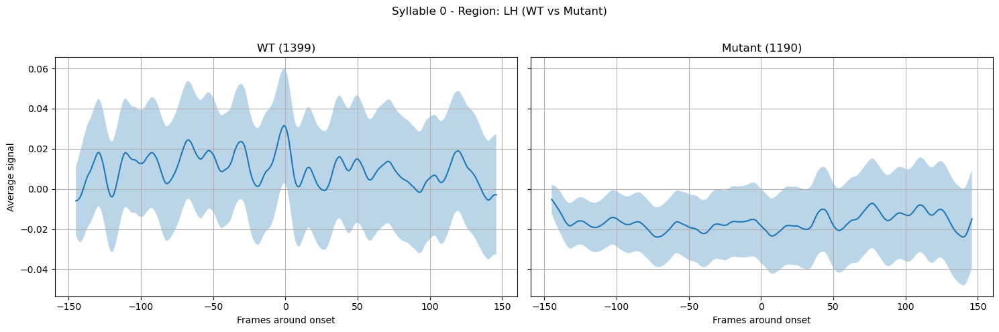

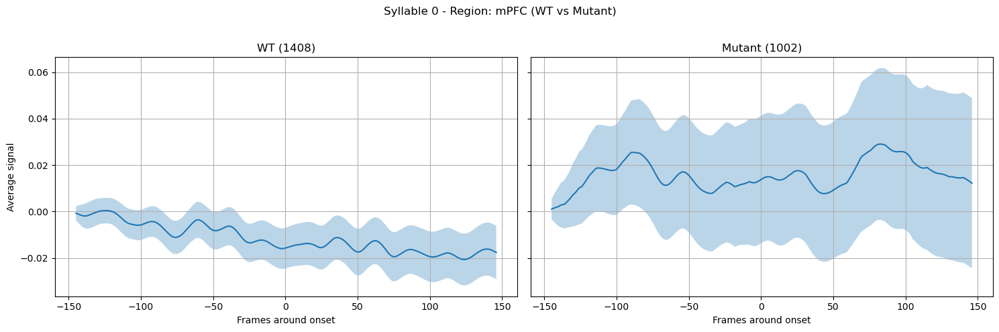

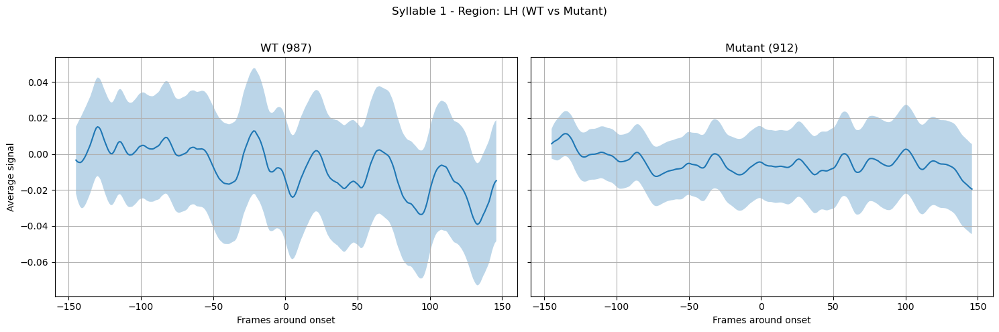

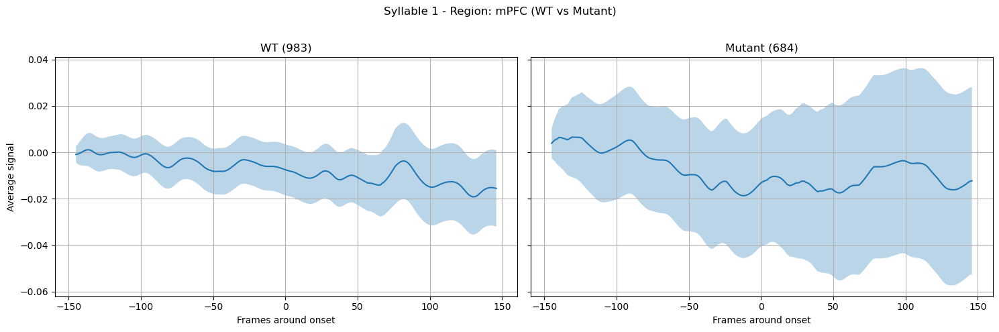

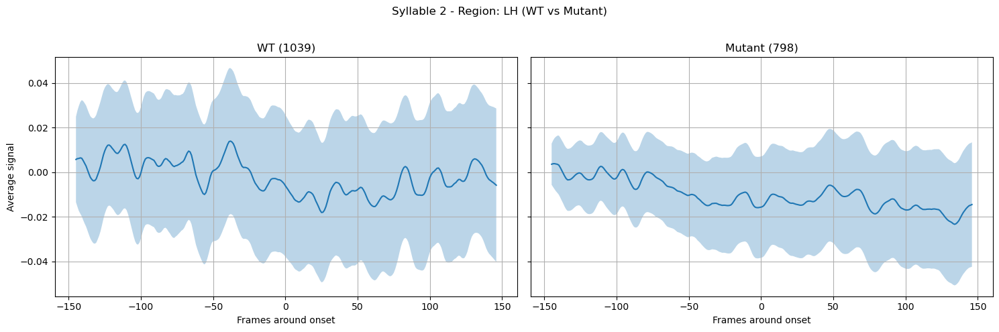

...

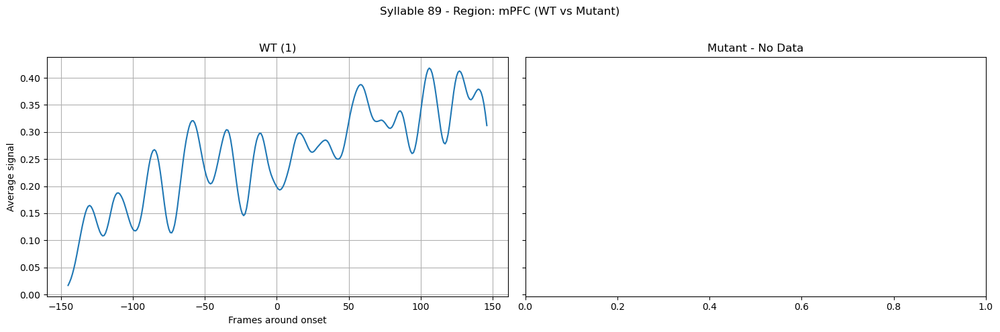

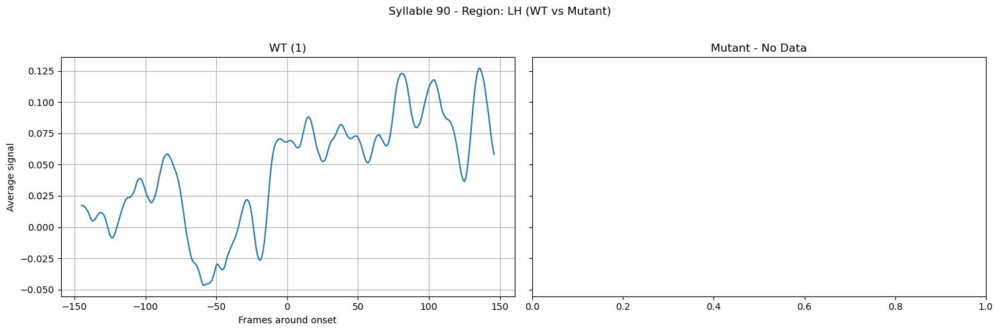

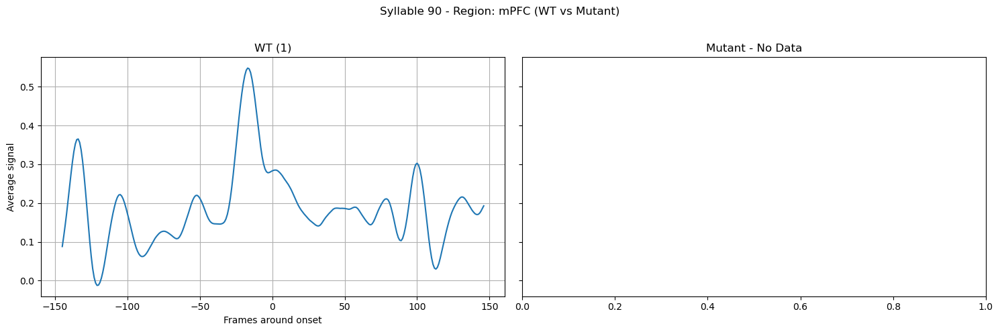

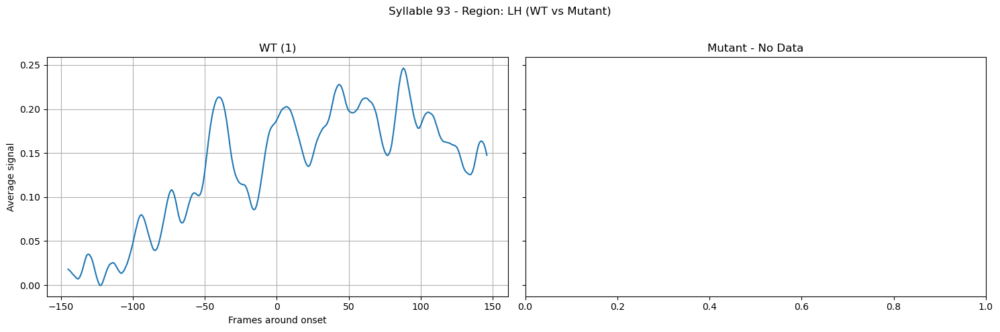

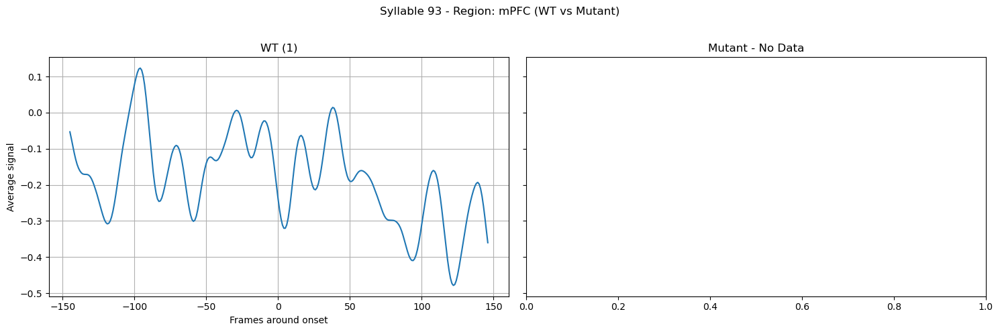

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Define WT IDs as strings to match the mouse_id format in processed_dfs keys
wt_ids = [str(id) for id in [69, 75, 77, 81, 85, 127, 125, 131, 135, 137, 133, 145, 147, 161]]

# Combine all processed DataFrames into one for analysis, adding region info as a column
processed_dfs_with_region = []
for (mouse_id, region), df in processed_dfs.items():
    df = df.copy()  # Avoid modifying the original DataFrame
    df['region'] = region  # Add region information as a new column
    df['type'] = 'WT' if mouse_id in wt_ids else 'Mutant'  # Mark as WT or Mutant
    processed_dfs_with_region.append(df)

combined_df = pd.concat(processed_dfs_with_region)

# Define parameters
num_frames_before = 150
num_frames_after = 150
window_size = num_frames_before + num_frames_after + 1
frame_range = np.arange(-num_frames_before, num_frames_after + 1)
smoothing_window = 10  # For rolling mean

# Initialize a nested dictionary for syllable -> region -> type -> list of windows
syllable_region_data = {}

# Collect syllables, regions, and types (WT or Mutant)
syllables = combined_df['syllable'].unique()
regions = combined_df['region'].unique()
types = combined_df['type'].unique()

# Pre-compute windows for each syllable onset across regions and types
for syllable in syllables:
    syllable_region_data[syllable] = {}
    for region in regions:
        syllable_region_data[syllable][region] = {'WT': [], 'Mutant': []}  # Initialize empty lists for each type
        
        for type_label in types:
            # Filter the DataFrame for the current region, syllable, and type
            df_type_region = combined_df[(combined_df['region'] == region) & (combined_df['type'] == type_label)]
            
            # Find onset indices where the syllable changes
            syllable_onsets = df_type_region[(df_type_region['syllable'] == syllable) & 
                                             (df_type_region['syllable'].shift(-1) != syllable)].index
            
            # Collect windows around each onset
            for onset_idx in syllable_onsets:
                start_idx = onset_idx - num_frames_before
                end_idx = onset_idx + num_frames_after + 1  # +1 to include the last frame
                
                # Ensure window is within bounds
                if start_idx >= 0 and end_idx <= len(df_type_region):
                    window = df_type_region['data'].iloc[start_idx:end_idx].values
                    
                    if len(window) == window_size:
                        # Normalize each window to have zero at the start
                        window = window - window[0]
                        
                        # Smooth each window with a 10-step rolling mean
                        smoothed_window = pd.Series(window).rolling(smoothing_window, center=True).mean().values
                        syllable_region_data[syllable][region][type_label].append(smoothed_window)

# Plot each syllable as a pair of subplots for WT and Mutant for each region
for syllable, region_dict in sorted(syllable_region_data.items(), key=lambda t: int(t[0])):
    for region, type_dict in region_dict.items():
        fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
        fig.suptitle(f'Syllable {int(syllable)} - Region: {region} (WT vs Mutant)')

        for ax, (type_label, windows) in zip(axes, type_dict.items()):
            if len(windows) == 0:
                ax.set_title(f'{type_label} - No Data')
                continue  # Skip if there are no windows for this combination

            # Convert list of windows to numpy array for calculations
            windows = np.array(windows)

            # Compute mean and 95% confidence interval
            mean_signal = np.nanmean(windows, axis=0)  # Using nanmean to handle potential NaNs from smoothing
            ci_95 = 1.96 * np.nanstd(windows, axis=0) / np.sqrt(windows.shape[0])  # 95% CI

            # Plot mean signal with confidence interval
            ax.plot(frame_range, mean_signal, label=f'{type_label}')
            ax.fill_between(frame_range, mean_signal - ci_95, mean_signal + ci_95, alpha=0.3)
            
            # Set labels and title
            ax.set_xlabel('Frames around onset')
            ax.grid()
            ax.set_title(f'{type_label} ({len(windows)})')
        
        # Y-axis label for both subplots
        axes[0].set_ylabel('Average signal')
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.savefig(f'{int(syllable)}_{region}.png')
        plt.show()
